# Lending Club Analysis - Sandeep/Chandan

Understanding the driving factors behind probable loan default ,i.e. the variables which are strong indicators of default and utilize this knowledge for its portfolio and risk assessment. 

### Read the Data

In [517]:
# Importing libraries for numpy & panda

import pandas as pd #To work with dataset
import numpy as np #Math library
import seaborn as sns #Graph library that use matplot in background
import matplotlib.pyplot as plt #to plot some parameters in seaborn
import warnings
warnings.filterwarnings("ignore")

# parse date columns
date_cols = ['next_pymnt_d','issue_d']
loanData = pd.read_csv ('loan.csv',index_col=0,parse_dates=date_cols)

### Data Exploration

In [518]:
loanData.head()

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
id,,,,,,,,,,,,,,,,,,,,,
1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [519]:
loanData.isnull().sum()

member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
term                              0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 110, dtype: int64

### Data Cleaning

In [521]:
#As we see too many columns with Null values 

perc = 75.0 # Removing columns with more than 75% null values
min_count =  int(((100-perc)/100)*loanData.shape[0] + 1)
loanDataFiltered = loanData.dropna( axis=1, 
                thresh=min_count)
loanDataFiltered.isnull().sum() # Now re-checking the filtered dataFrame for null values 

member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
term                              0
int_rate                          0
installment                       0
grade                             0
sub_grade                         0
emp_title                      2459
emp_length                     1075
home_ownership                    0
annual_inc                        0
verification_status               0
issue_d                           0
loan_status                       0
pymnt_plan                        0
url                               0
desc                          12940
purpose                           0
title                            11
zip_code                          0
addr_state                        0
dti                               0
delinq_2yrs                       0
earliest_cr_line                  0
inq_last_6mths                    0
mths_since_last_delinq      

In [522]:
### Checking Column Names to make sure they dont have spaces of garbage values
loanDataFiltered.columns

Index(['member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term',
       'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'policy_code', 'application_type',
       'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
       'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

In [523]:
loanDataFiltered.shape

(39717, 54)

In [524]:
# Drop columns which are not required for analysis
loanDataFiltered =   loanDataFiltered.drop(['member_id','desc','earliest_cr_line', 'url','policy_code','zip_code'], axis=1)
# Furthur Customer behaviour columns which are not required for analysis
loanDataFiltered =   loanDataFiltered.drop(['tax_liens','delinq_amnt','chargeoff_within_12_mths', 'acc_now_delinq','collections_12_mths_ex_med','total_rec_late_fee'], axis=1)
loanDataFiltered =   loanDataFiltered.drop(['emp_title','pymnt_plan','title',
                                            'initial_list_status','mths_since_last_delinq','initial_list_status'
,'application_type'], axis=1)
loanDataFiltered =   loanDataFiltered.drop(['pub_rec_bankruptcies','addr_state','inq_last_6mths','pub_rec','revol_bal','total_acc','out_prncp_inv','last_pymnt_amnt','last_credit_pull_d','delinq_2yrs','collection_recovery_fee','revol_util','total_pymnt_inv','out_prncp','recoveries','last_pymnt_d','total_rec_prncp','total_rec_int','out_prncp_inv','open_acc'], axis=1)
loanDataFiltered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39717 entries, 1077501 to 87023
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   loan_amnt            39717 non-null  int64  
 1   funded_amnt          39717 non-null  int64  
 2   funded_amnt_inv      39717 non-null  float64
 3   term                 39717 non-null  object 
 4   int_rate             39717 non-null  object 
 5   installment          39717 non-null  float64
 6   grade                39717 non-null  object 
 7   sub_grade            39717 non-null  object 
 8   emp_length           38642 non-null  object 
 9   home_ownership       39717 non-null  object 
 10  annual_inc           39717 non-null  float64
 11  verification_status  39717 non-null  object 
 12  issue_d              39717 non-null  object 
 13  loan_status          39717 non-null  object 
 14  purpose              39717 non-null  object 
 15  dti                  39717 non

### Imputing Values

In [525]:
# Understand null values in data frame 
loanDataFiltered.isnull().sum()

loan_amnt                 0
funded_amnt               0
funded_amnt_inv           0
term                      0
int_rate                  0
installment               0
grade                     0
sub_grade                 0
emp_length             1075
home_ownership            0
annual_inc                0
verification_status       0
issue_d                   0
loan_status               0
purpose                   0
dti                       0
total_pymnt               0
dtype: int64

In [526]:
loanDataFiltered['emp_length']=loanDataFiltered['emp_length'].fillna(loanDataFiltered['emp_length'].mode()[0])

#### Change Data Types and take out month from issue_date of loan 

In [527]:
# Changing datatype to string and month form date
loanDataFiltered[['term','int_rate','grade','sub_grade','emp_length','home_ownership','verification_status','loan_status','purpose','issue_d']] =   loanDataFiltered[['term','int_rate','grade','sub_grade','emp_length','home_ownership','verification_status','loan_status','purpose','issue_d']].astype('string')
loanDataFiltered.issue_d = loanDataFiltered.issue_d.apply(lambda x: (x[0:3]))
loanDataFiltered['issue_d'].tail()

id
92187    Jul
90665    Jul
90395    Jul
90376    Jul
87023    Jun
Name: issue_d, dtype: object

In [528]:
# remove % from intrest
loanDataFiltered.int_rate = loanDataFiltered.int_rate.apply(lambda x: (x[0:-1]))
loanDataFiltered.int_rate.value_counts()

10.99    956
13.49    826
11.49    825
7.51     787
7.88     725
        ... 
18.36      1
16.96      1
16.15      1
16.01      1
17.44      1
Name: int_rate, Length: 371, dtype: int64

In [529]:
loanDataFiltered['loan_status'].value_counts()

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: Int64

In [530]:
# CLeaning loan status to only defaulter or Non Defaulter
loanDataFiltered.loan_status = loanDataFiltered.loan_status.apply(lambda x: "Defaulted" if x=="Charged Off" else "Non_Defaulted")
loanDataFiltered.loan_status.value_counts()

Non_Defaulted    34090
Defaulted         5627
Name: loan_status, dtype: int64

In [531]:
# Remove Outliers

cols = ['loan_amnt','int_rate','annual_inc','dti'] # one or more

Q1 = loanDataFiltered[cols].quantile(0.25)
Q3 = loanDataFiltered[cols].quantile(0.75)
IQR = Q3 - Q1

loanDataFiltered = loanDataFiltered[~((loanDataFiltered[cols] < (Q1 - 1.5 * IQR)) |(loanDataFiltered[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]


In [532]:
# import lib for plotly
import plotly.offline as py 
py.init_notebook_mode(connected=True) # this code, allow us to work with offline plotly version
import plotly.graph_objs as go # it's like "plt" of matplot
import plotly.tools as tls # It's useful to we get some tools of plotly
import warnings # This library will be used to ignore some warnings
from collections import Counter # To do counter of some features
import plotly.io as pio

# Analysis Points

## 1. Loans with low loan amount [around 5k] are mostly Defaulted ,  whereas higher ones [around 34k] are less likely to be Defaulted Loans 

In [533]:
tr0 = go.Bar(
            x = loanDataFiltered[loanDataFiltered["loan_status"]== 'Non_Defaulted']["loan_status"].value_counts().index.values,
            y = loanDataFiltered[loanDataFiltered["loan_status"]== 'Non_Defaulted']["loan_status"].value_counts().values,
            name='Good credit'
    )

tr1 = go.Bar(
            x = loanDataFiltered[loanDataFiltered["loan_status"]== 'Defaulted']["loan_status"].value_counts().index.values,
            y = loanDataFiltered[loanDataFiltered["loan_status"]== 'Defaulted']["loan_status"].value_counts().values,
            name='Bad credit'
    )

data = [tr0, tr1]

layout = go.Layout(
    
)

layout = go.Layout(
    yaxis=dict(
        title='Count'
    ),
    xaxis=dict(
        title='Loan Status '
    ),
    title='Univariate Analysis'
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='grouped-bar')

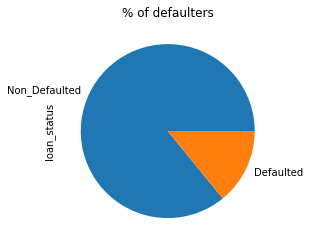

In [534]:
#Plot a bar chart to see distribution
loanDataFiltered['loan_status'].value_counts().plot.pie()
plt.title('% of defaulters')
plt.show()

### 2. Term of 36 months has more defaulters

In [535]:
df_good = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Non_Defaulted']['term'].values
df_bad = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Defaulted']['term'].values
df_term = loanDataFiltered['term'].values

#First plot
tr0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Good Loan"
)
#Second plot
tr1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Bad Loan"
)
#Third plot
tr2 = go.Histogram(
    x=df_term,
    histnorm='probability',
    name="Term"
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Good','Bad', 'General Distribuition'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='Term Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')



### 3. Grade [B,D and C] are top most candidates of Band loans . Out of this Grade [C,D] gives more Bad loans than Good Loans .  

In [536]:
df_good = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Non_Defaulted']['grade'].values
df_bad = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Defaulted']['grade'].values
df_term = loanDataFiltered['grade'].values

#First plot
tr0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Good Loan"
)
#Second plot
tr1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Bad Loan"
)
#Third plot
tr2 = go.Histogram(
    x=df_term,
    histnorm='probability',
    name="Grade"
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Good','Bad', 'General Distribuition'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='grade Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')




### 4.Too much experience and freshers top bad loans . Employee with 10+ yrs , <=2 years top the bad loans 

In [537]:
df_good = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Non_Defaulted']['emp_length'].values
df_bad = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Defaulted']['emp_length'].values
df_term = loanDataFiltered['emp_length'].values

#First plot
tr0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Good Loan"
)
#Second plot
tr1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Bad Loan"
)
#Third plot
tr2 = go.Histogram(
    x=df_term,
    histnorm='probability',
    name="emp_length"
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 1}, None]],
                          subplot_titles=('Good','Bad', 'General Distribuition'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='emp_length Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')



### 5.Loans allocated for debt_consolidation peaks bad loans 

In [538]:
df_good = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Non_Defaulted']['purpose'].values
df_bad = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Defaulted']['purpose'].values
df_term = loanDataFiltered['purpose'].values

#First plot
tr0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Good Loan"
)
#Second plot
tr1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Bad Loan"
)
#Third plot
tr2 = go.Histogram(
    x=df_term,
    histnorm='probability',
    name="home_ownership"
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 1}, None]],
                          subplot_titles=('Good','Bad', 'General Distribuition'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='home_ownership Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')


### 6. People with below subgrades have highest defaulters
#### C[C1,C2] , B[B3,B4,B5],D[D2] 

In [539]:
df_good = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Non_Defaulted']['sub_grade'].values
df_bad = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Defaulted']['sub_grade'].values
df_term = loanDataFiltered['sub_grade'].values

#First plot
tr0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Good Loan"
)
#Second plot
tr1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Bad Loan"
)
#Third plot
tr2 = go.Histogram(
    x=df_term,
    histnorm='probability',
    name="sub_grade"
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 1}, None]],
                          subplot_titles=('Good','Bad', 'General Distribuition'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='sub_grade Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

## People having intrest around [10-15]% have max defaulters , we see peak around  11 

In [540]:
df_good = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Non_Defaulted']['int_rate'].values
df_bad = loanDataFiltered.loc[loanDataFiltered.loan_status== 'Defaulted']['int_rate'].values
df_term = loanDataFiltered['int_rate'].values

#First plot
tr0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Good Loan"
)
#Second plot
tr1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Bad Loan"
)
#Third plot
tr2 = go.Histogram(
    x=df_term,
    histnorm='probability',
    name="int_rate"
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 1}, None]],
                          subplot_titles=('Good','Bad', 'General Distribuition'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='intrest Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

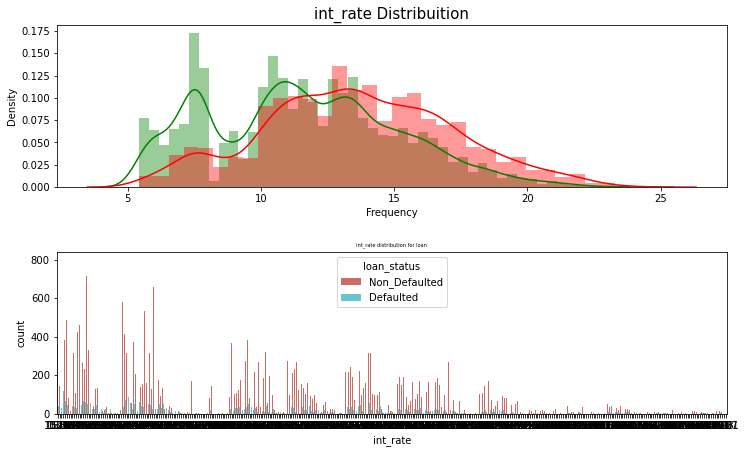

In [541]:
df_good = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']
df_bad = loanDataFiltered[loanDataFiltered.loan_status== 'Defaulted']

fig, ax = plt.subplots(nrows=2, figsize=(12,8))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g1 = sns.distplot(df_good["int_rate"], ax=ax[0], 
             color="g")
g1 = sns.distplot(df_bad["int_rate"], ax=ax[0], 
             color='r')
g1.set_title("int_rate Distribuition", fontsize=15)
g1.set_xlabel("int_rate")
g1.set_xlabel("Frequency")

g2 = sns.countplot(x="int_rate",data=loanDataFiltered, 
              palette="hls", ax=ax[1], 
              hue = "loan_status")
g2.set_title("int_rate distribution for loan", fontsize=5)
g2.set_xlabel("int_rate")
plt.show()

In [210]:
loanDataFiltered.corr()

,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,total_pymnt,pub_rec_bankruptcies
loan_amnt,1.000000,0.981578,0.940034,0.930288,0.271149,0.066439,0.886613,-0.037180
funded_amnt,0.981578,1.000000,0.958422,0.956159,0.266965,0.066283,0.903160,-0.038502
funded_amnt_inv,0.940034,0.958422,1.000000,0.905039,0.254375,0.074689,0.881228,-0.042746
installment,0.930288,0.956159,0.905039,1.000000,0.270874,0.054186,0.856928,-0.034103
annual_inc,0.271149,0.266965,0.254375,0.270874,1.000000,-0.122732,0.257980,-0.016801
dti,0.066439,0.066283,0.074689,0.054186,-0.122732,1.000000,0.064766,0.005691
total_pymnt,0.886613,0.903160,0.881228,0.856928,0.257980,0.064766,1.000000,-0.043661
pub_rec_bankruptcies,-0.037180,-0.038502,-0.042746,-0.034103,-0.016801,0.005691,-0.043661,1.000000


In [271]:
loanDataFiltered.loan_amnt.max()

35000

In [542]:
#Creating an categorical variable to handle with the Loan Amount variable

#Let's look the Loan Amount column
interval = (1000,10000,15000,20000,25000,40000)

cats = ['VeryLow', 'Low', 'Medium','High','VeryHigh']
loanDataFiltered["loan_cat"] = pd.cut(loanDataFiltered.loan_amnt, interval, labels=cats)
df_good = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']
df_bad = loanDataFiltered[loanDataFiltered.loan_status== 'Defaulted']

### People having dti ratio between [8-19] have bad loans . This is observed more significantly with smaller loan value especially  

In [543]:
tr0 = go.Box(
    y=df_good["dti"],
    x=df_good["loan_cat"],
    name='Good loan',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=df_bad['dti'],
    x=df_bad['loan_cat'],
    name='Bad loan',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='dti ratio',
        zeroline=False
    ),
    xaxis=dict(
        title='Loan Categorical'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

### People having Rent and Mortgaged houses have max Bad loans 

In [544]:
#Having a look at housing own by Load Defaulter

#First plot
tr0 = go.Bar(
    
    x = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']["home_ownership"].value_counts().index.values,
    y = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']["home_ownership"].value_counts().values,
    name='Good credit'
)

#Second plot
tr1 = go.Bar(
  x = loanDataFiltered[loanDataFiltered.loan_status== 'Defaulted']["home_ownership"].value_counts().index.values,
    y = loanDataFiltered[loanDataFiltered.loan_status== 'Defaulted']["home_ownership"].value_counts().values,
    name="Bad Credit"
)

data = [tr0, tr1]

layout = go.Layout(
    title='Housing Distribuition'
)


fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='Housing-Grouped')

### During Year_end maximum number of Bad Loans are granted . Highest during December followed by Nov , Oct and Jan .

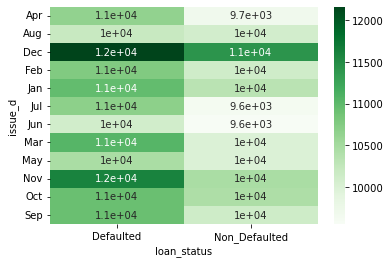

In [545]:
import seaborn as sns
#result = pd.pivot_table(data=loanDataFiltered,index="issue_d",columns="loan_cat",values="loan_status")
result = pd.pivot_table(data=loanDataFiltered,index="issue_d",columns="loan_status",values="loan_amnt")
##Apply customisations
sns.heatmap(result,cmap="Greens",annot=True)
plt.show()

### People who apply for less loan amount and are not verified result in defaulter . They might have thinking it will be a loss to authority to search for defaulters with very less loan amount sanctioned 

In [546]:
#First plot
tr0 = go.Bar(
    
    x = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']["verification_status"].value_counts().index.values,
    y = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']["loan_amnt"].value_counts().values,
    name='Good Loan'
)

#First plot 2
tr1 = go.Bar(
    x = loanDataFiltered[loanDataFiltered.loan_status== 'Defaulted']["verification_status"].value_counts().index.values,
    y = loanDataFiltered[loanDataFiltered.loan_status== 'Defaulted']["loan_amnt"].value_counts().values,
    name='Bad Loan'
)

#Second plot
tr2 = go.Box(   
    x = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']["verification_status"],
    y = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']["loan_amnt"],
    name=tr0.name
)

#Second plot 2
tr3 = go.Box(
    x = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']["verification_status"],
    y = loanDataFiltered[loanDataFiltered.loan_status== 'Non_Defaulted']["loan_amnt"],
    name=tr1.name
)

data = [tr0, tr1, tr2,tr3]


fig = tls.make_subplots(rows=1, cols=2, 
                        subplot_titles=('verification_status', 'loan_amnt by verification_status'))

fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 1)
fig.append_trace(tr2, 1, 2)
fig.append_trace(tr3, 1, 2)

fig['layout'].update(height=400, width=800, title='verification_status Distribuition', boxmode='group')
py.iplot(fig, filename='sex-subplot')

### Frequently low earning people take small loans .

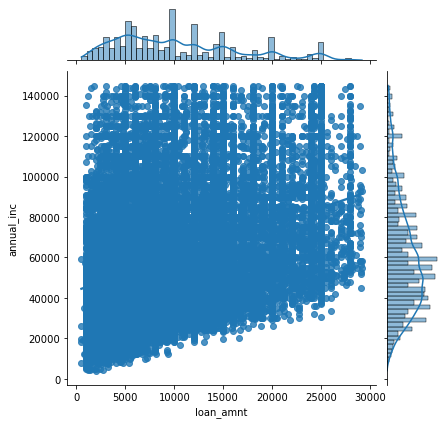

In [547]:
### Plot the same thing now using a jointplot
sns.jointplot(loanDataFiltered.loan_amnt,loanDataFiltered.annual_inc,kind="reg")
plt.show()

### Recommendations 


#### High Risk months needs extra catiousness in granting loans , especially small loans [around 5k] in Dec. Year-end months is followed by year-start month [Jan]

####  Lower Grant of loans Newly joined emplyees who belong to C and B grades with tenure less than 2 yrs , if they take loans during above Risk months and have less salary and live on Rent .Similar for expirenced employees . Even if the loan amount is less this should be followed . In case they are provided loans , they should be given more time to pay the loan at slightly lower intrest , if possible . 

#### Increase scrutiny in allocating loans with  - less amount loans for short term , People under grades C . This should be followed by B and D,People living on rent especially in above grade , People who belong to Grade- C,B and D and are living on Rent should not be given short team loans for 36 months during High risk months . In case they are still given loans , it is mandatory to be of verified_status 

### Conclusions and observations 
#### Loans where less time is given to repay the loans [36 months] , people are defaulted . 
#### Employees with Grade B,D,C more defaults . Loans to C and D makes losses are they give more bad loans to good loans . Among these , People with below subgrades have highest defaulters C[C1,C2] , B[B3,B4,B5],D[D2] 
#### Employees age people and very new employees fail to repay the loans . Mostly they take loans for enjoying purpose and they cant pay it back . Old age people due to their helath conditions and new due to careleness.
#### Loans where puspose is debt_consolidation people are not able to pay back 
#### People having intrest around [10-15]% have max defaulters , we see peak around 11
#### People having dti ratio between [8-19] have bad loans . This is observed more significantly with smaller loan value especially.
#### People having Rent and Mortgaged houses have max Bad loans 
#### During Year_end maximum number of Bad Loans are granted . Highest during December followed by Nov , Oct 
#### People who apply for less loan amount and are not verified result in defaulter . They might have thinking it will be a loss to authority to search for defaulters with very less loan amount sanctioned 
#### Frequently low earning people take small loans .
#### Grade C and D give more bad loans then good . 
